In [1]:
import tensorflow as tf
import keras 
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import re
from keras.preprocessing.image import img_to_array

## color, gray 이미지 가져오기

In [2]:
# 파일을 순서대로 정렬해주기
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

In [3]:
# 이미지 크기 결정
SIZE = 256

# 컬러이미지 전처리 후 list에 저장
color_img = []
path = 'C:/archive2/landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '300.jpg':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        color_img.append(img_to_array(img))

  4%|███▎                                                                          | 300/7129 [00:00<00:17, 398.90it/s]


In [4]:
# 흑백이미지 전처리 후 list에 저장
gray_img = []
path = 'C:/archive2/landscape Images/black'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '300.jpg':
        break
    else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        gray_img.append(img_to_array(img))

  4%|███▎                                                                          | 300/7129 [00:00<00:15, 431.65it/s]


In [5]:
# tf.data.Dataset를 사용하여 NumPy 배열 로드하기 및 batchsize 설정
color_dataset=tf.data.Dataset.from_tensor_slices(np.array(color_img)).batch(32)
gray_dataset=tf.data.Dataset.from_tensor_slices(np.array(gray_img)).batch(32)

In [6]:
# 반복해서 각 데이터셋에서 다음 데이터 가져오기
example_color = next(iter(color_dataset))
example_gray = next(iter(gray_dataset))

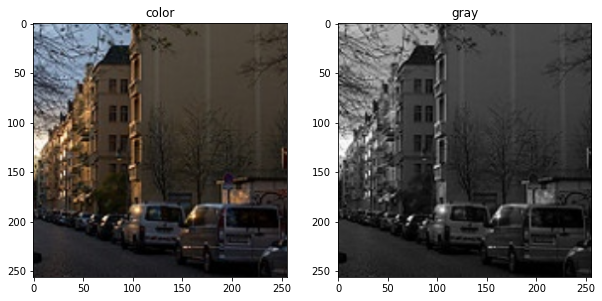

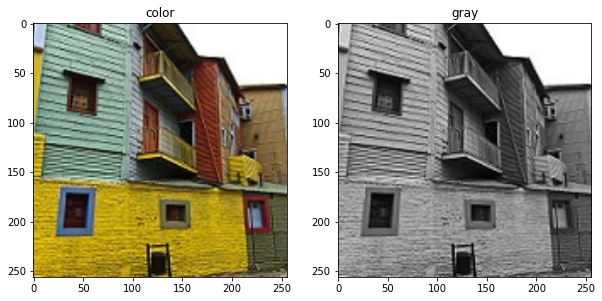

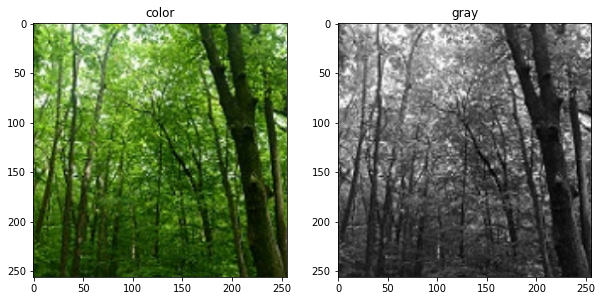

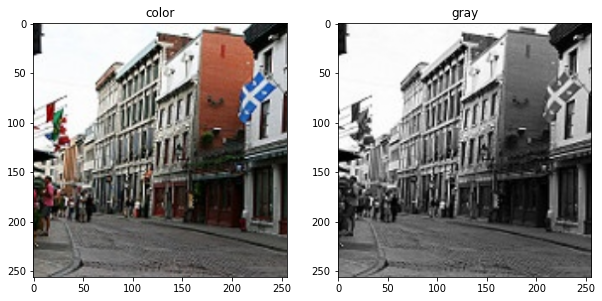

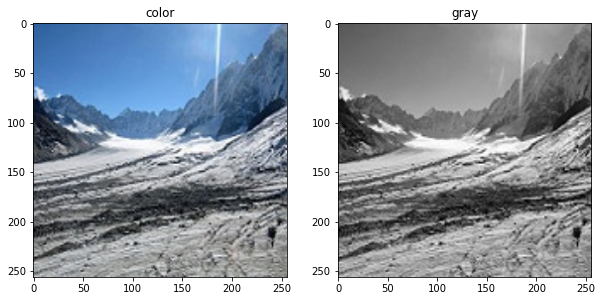

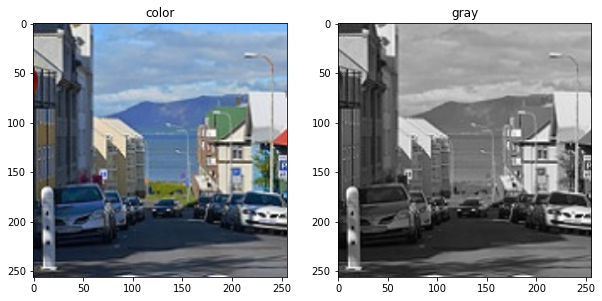

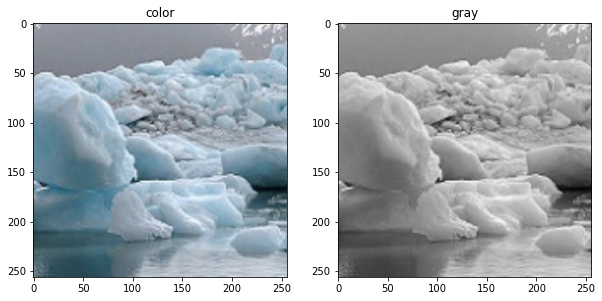

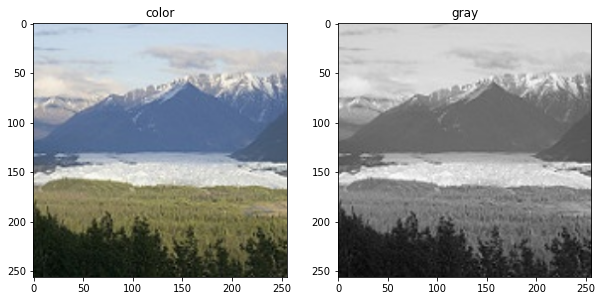

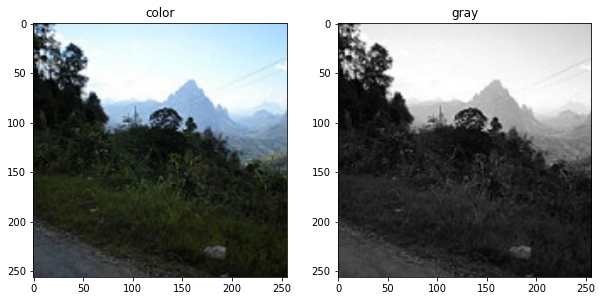

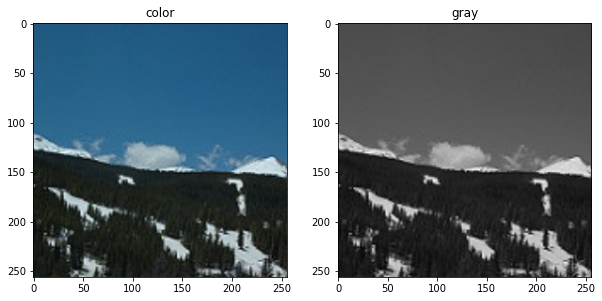

In [7]:
# 가져온 그림 보여주기(3개의 쌍)
def plot_images(a = 10):
    for i in range(a):
        plt.figure(figsize = (10,10))
        plt.subplot(121)
        plt.title('color')
        plt.imshow(example_color[i] )

        plt.subplot(122)
        plt.title('gray') 
        plt.imshow(example_gray[i])
        plt.show()

plot_images(10)

# 첫번째 방식 : UNet

## Generator
- downsample 한다음에 upsample 한다.

### 1. 인코더 한 레이어부분

In [8]:
# filter = ouput 채널 수, size = ex : 3x3, batchnorm = 쓸지 말지 결정
def downsample(filters, size, apply_batchnorm=True):

    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer='he_normal', use_bias=False))

    # batchnorm 쓸지 말지에 따라 추가
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    # 무조건 LeakyReLU를 추가
    result.add(tf.keras.layers.LeakyReLU())

    return result

### 2. 디코더 한 레이어부분

In [9]:
# filter = ouput 채널 수, size = ex : 3x3, apply_dropout = 쓸지 말지 결정
def upsample(filters, size, apply_dropout=False):
    
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,padding='same',kernel_initializer='he_normal',use_bias=False))

    # 무조건 BatchNormalization을 추가
    result.add(tf.keras.layers.BatchNormalization())

    # dropout을 쓸지 말지에 따라 추가
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    # 무조건 ReLU를 추가
    result.add(tf.keras.layers.ReLU())

    return result    

### 3. Downsample + Upsample

In [10]:
def UNet_Generator():
    inputs = tf.keras.layers.Input(shape=[256,256,3])

    # downsample을 통해 1x1 까지 줄임
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    # 128x128까지 되었는데, 마지막은 unet 구조를 사용함
    # channel = 4, 활성함수를 -1에서 1 사이의 값을 출력하는 tanh를 사용함
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

    # input 레이어
    x = inputs

    # Downsampling through the model
    # unet의 구조처럼 skip connection 만듦
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    # 맨 마지막꺼 뺴고 reverse
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [11]:
UNet_generator = UNet_Generator()
UNet_generator.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 64, 64, 128)  131584      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 32, 32, 256)  525312      sequential_1[0][0]               
_______________________________________________________________________________________

## Discriminator

In [12]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [13]:
discriminator = Discriminator()
discriminator.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_image (InputLayer)        [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
target_image (InputLayer)       [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_image[0][0]                
                                                                 target_image[0][0]               
__________________________________________________________________________________________________
sequential_15 (Sequential)      (None, 128, 128, 64) 6144        concatenate_7[0][0]   

In [14]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

LAMBDA = 100

## Loss Function

In [15]:
def discriminator_loss(disc_real_output, disc_generated_output):
    # 진짜 이미지가 들어오면 모두 1로 채운다
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    # 생성된 이미지(가짜 이미지)가 들어오면 모두 0으로 채운다
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    # 이 두개를 더한 loss
    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [16]:
def generator_loss(disc_generated_output, gen_output, target):
    # 내가 만든 output이 들어갔을 때 discriminator가 뱉어준 output을 다 1로 채운다
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mean absolute error
    # 원래 정답과 ouput을 빼서 절댓값을 빼서 구함
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

## Train

In [17]:
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = UNet_generator(input_image, training=True)
        
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, UNet_generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, UNet_generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

In [18]:
import time

def fit(train_ds, epochs,):
    for epoch in range(epochs):
        start = time.time()
        print("Epoch: ", epoch+1)

        # Train
        for n, (input_image, target) in train_ds.enumerate():
            train_step(input_image, target, epoch)
        print()

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))

# 두번째 방식 : autoencoder

In [19]:
def down(filters , kernel_size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
        
    downsample.add(keras.layers.LeakyReLU())
    
    return downsample

In [20]:
def up(filters, kernel_size, dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    
    if dropout:
        upsample.dropout(0.2)
        
    upsample.add(keras.layers.LeakyReLU())
    
    return upsample

In [21]:
def model():
    inputs = layers.Input(shape= [256,256,3])
    
    d1 = down(128,(3,3),False)(inputs)
    d2 = down(128,(3,3),False)(d1)
    d3 = down(256,(3,3),True)(d2)
    d4 = down(512,(3,3),True)(d3)
    d5 = down(512,(3,3),True)(d4)
    
    #upsampling
    u1 = up(512,(3,3),False)(d5)
    u1 = layers.concatenate([u1,d4])
    u2 = up(256,(3,3),False)(u1)
    u2 = layers.concatenate([u2,d3])
    u3 = up(128,(3,3),False)(u2)
    u3 = layers.concatenate([u3,d2])
    u4 = up(128,(3,3),False)(u3)
    u4 = layers.concatenate([u4,d1])
    u5 = up(3,(3,3),False)(u4)
    u5 = layers.concatenate([u5,inputs])
    
    output = layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(u5)
    
    return tf.keras.Model(inputs=inputs, outputs=output)

In [22]:
model = model()
model.summary()

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential_18 (Sequential)      (None, 128, 128, 128 3584        input_2[0][0]                    
__________________________________________________________________________________________________
sequential_19 (Sequential)      (None, 64, 64, 128)  147584      sequential_18[0][0]              
__________________________________________________________________________________________________
sequential_20 (Sequential)      (None, 32, 32, 256)  296192      sequential_19[0][0]              
_______________________________________________________________________________________

# UNet 결과출력

In [23]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


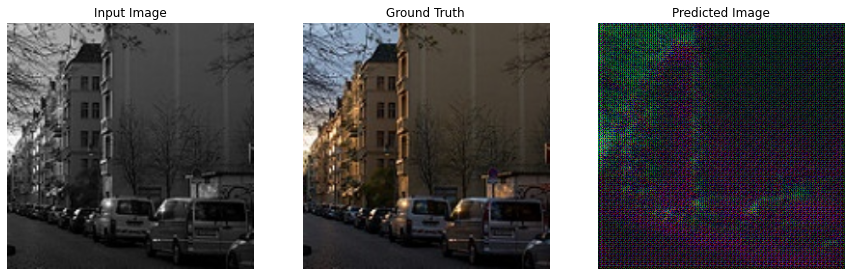

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


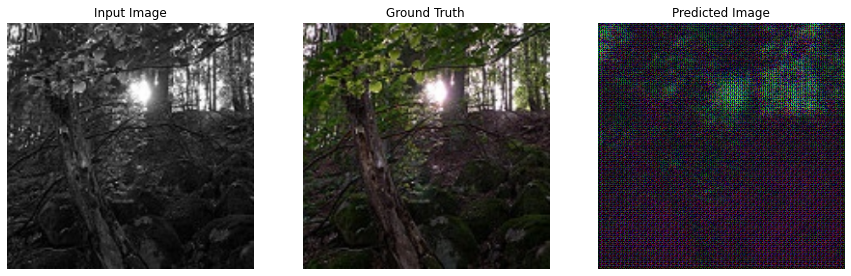

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


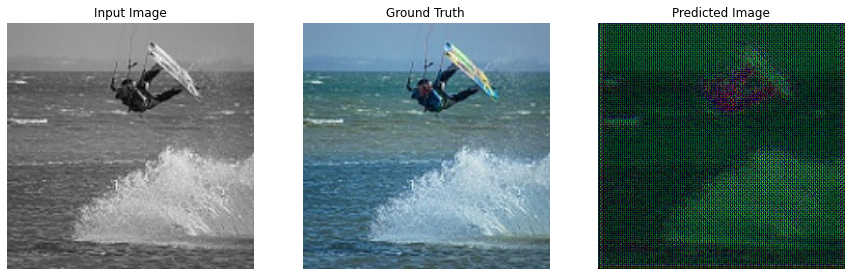

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


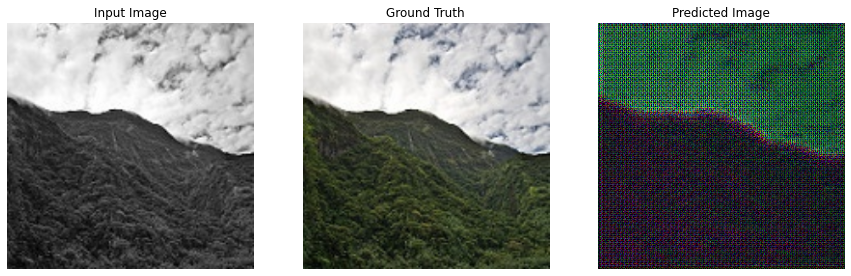

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


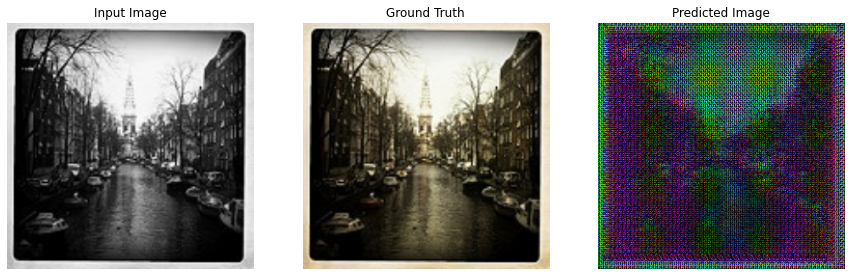

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


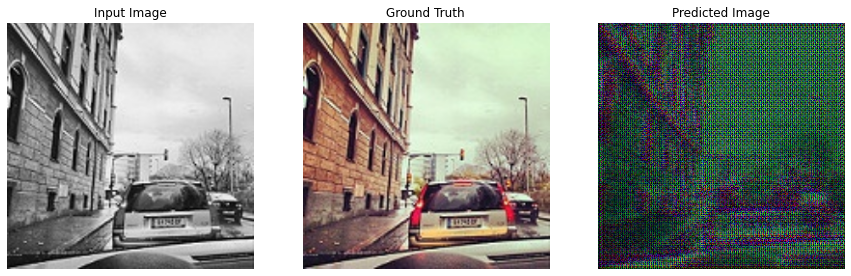

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


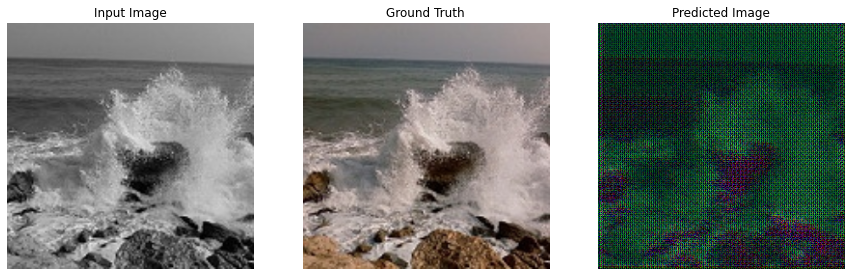

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


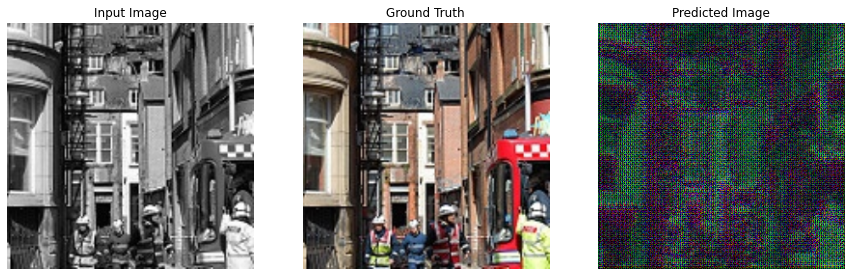

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


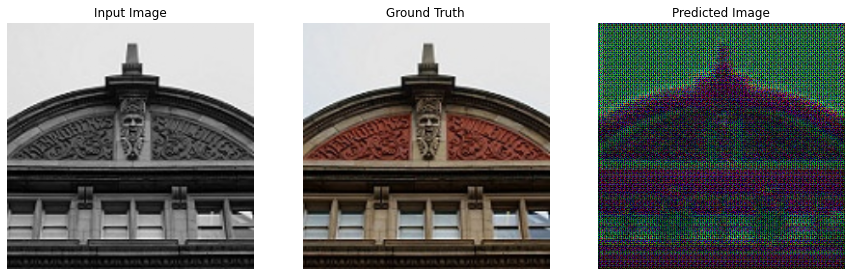

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


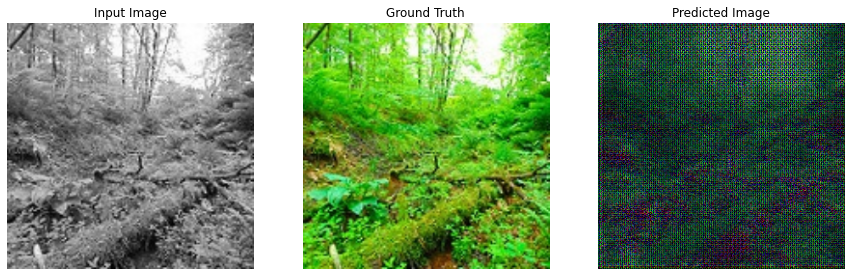

In [24]:
for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)):
    generate_images(UNet_generator, example_input, example_target)

In [25]:
fit(tf.data.Dataset.zip((gray_dataset, color_dataset)), epochs = 100)

Epoch:  1

Time taken for epoch 1 is 250.1996648311615 sec

Epoch:  2

Time taken for epoch 2 is 245.24695825576782 sec

Epoch:  3

Time taken for epoch 3 is 246.53507614135742 sec

Epoch:  4

Time taken for epoch 4 is 246.3539001941681 sec

Epoch:  5

Time taken for epoch 5 is 246.64819598197937 sec

Epoch:  6

Time taken for epoch 6 is 245.69624590873718 sec

Epoch:  7

Time taken for epoch 7 is 247.44177293777466 sec

Epoch:  8

Time taken for epoch 8 is 247.42516803741455 sec

Epoch:  9

Time taken for epoch 9 is 250.93077158927917 sec

Epoch:  10

Time taken for epoch 10 is 250.06789302825928 sec

Epoch:  11

Time taken for epoch 11 is 251.4891333580017 sec

Epoch:  12

Time taken for epoch 12 is 249.4243185520172 sec

Epoch:  13

Time taken for epoch 13 is 255.6529085636139 sec

Epoch:  14

Time taken for epoch 14 is 248.12027740478516 sec

Epoch:  15

Time taken for epoch 15 is 250.33584356307983 sec

Epoch:  16

Time taken for epoch 16 is 250.9283332824707 sec

Epoch:  17

Time

In [26]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']


    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

In [27]:
def evaluate(model, dataset):
    avg_mse = 0
    it = 0
    psnr = 0
        
    for test_input, tar in dataset :
        it += 1
        print(it)
        gen_output = model(test_input, training=True)
        avg_mse += tf.reduce_mean(tf.compat.v1.squared_difference(tar, gen_output)).numpy()
        
    avg_mse /= it
    avg_mse = avg_mse * 255 * 255
    psnr = 10 * np.log10(255*255/avg_mse)
    return avg_mse, psnr

In [28]:
def ssim(y_true , y_pred):
    u_true = np.mean(y_true)
    u_pred = np.mean(y_pred)
    var_true = np.var(y_true)
    var_pred = np.var(y_pred)
    std_true = np.sqrt(var_true)
    std_pred = np.sqrt(var_pred)
    c1 = np.square(0.01*7)
    c2 = np.square(0.03*7)
    ssim = (2 * u_true * u_pred + c1) * (2 * std_pred * std_true + c2)
    denom = (u_true ** 2 + u_pred ** 2 + c1) * (var_pred + var_true + c2)
    return ssim / denom

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


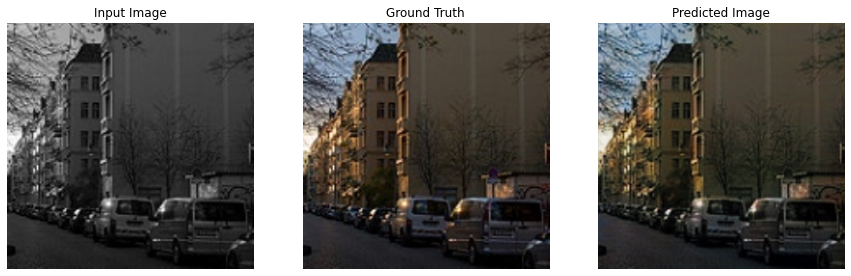

0.9988431897304483


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


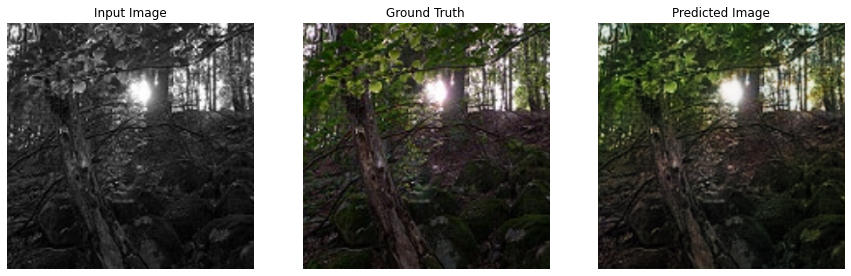

1.998014825374793


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


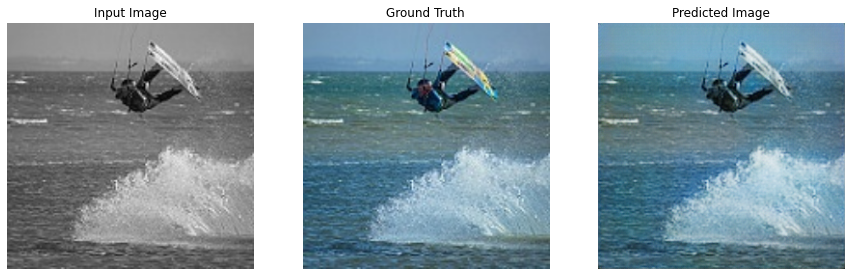

2.9962124327976425


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


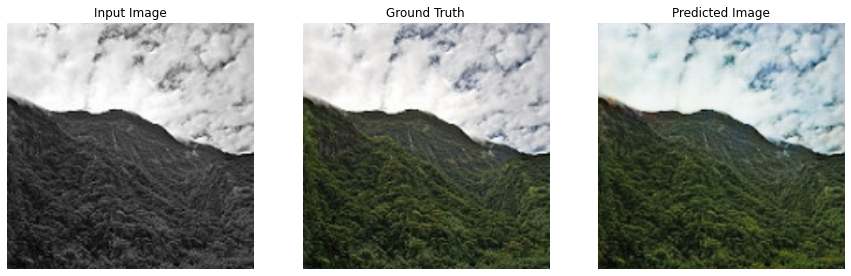

3.995101546349163


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


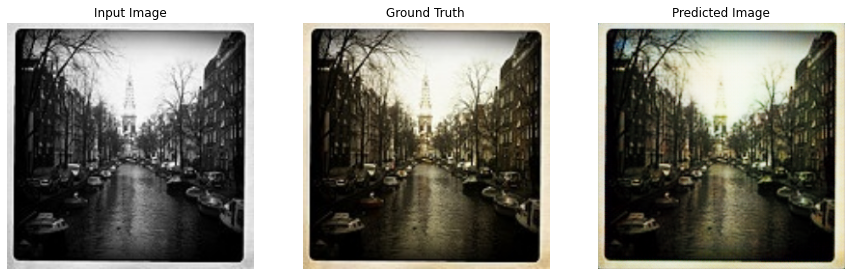

4.993909883119425


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


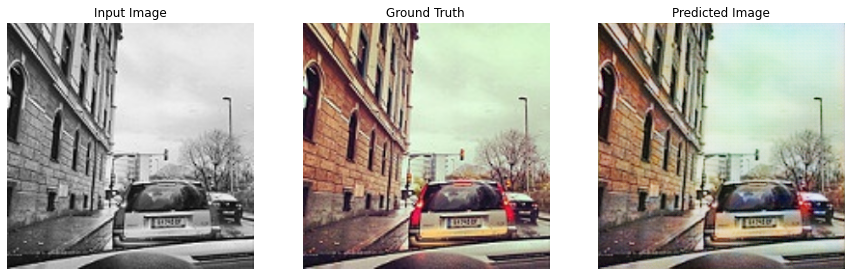

5.9917874715011505


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


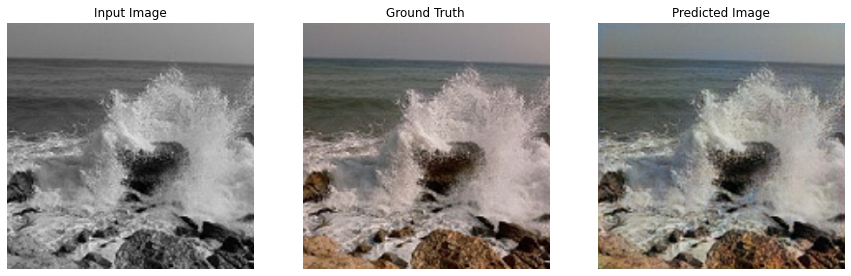

6.990570932024463


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


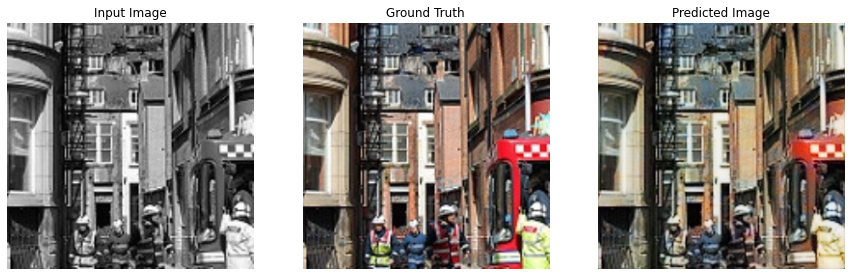

7.9891014097973585


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


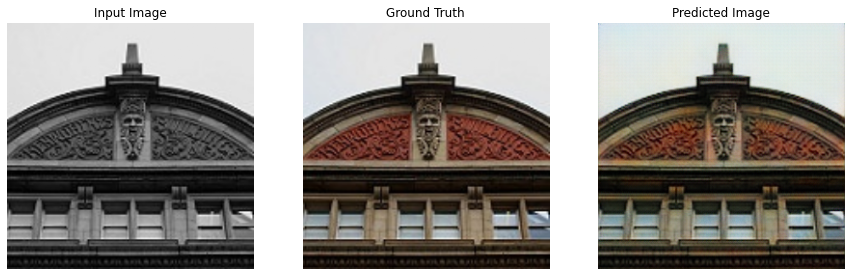

8.987661448077828


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


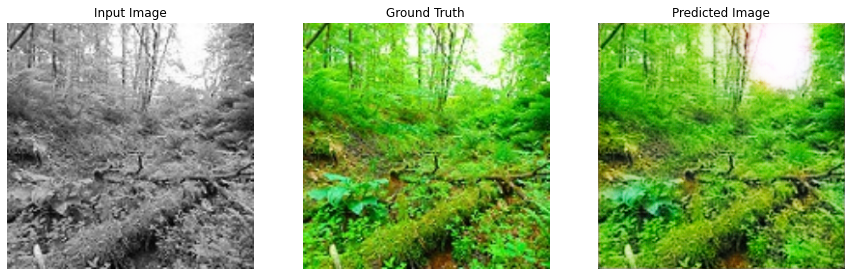

9.982023899249365


In [29]:
ssimValue = 0
for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)):
    generate_images(UNet_generator, example_input, example_target)
    ssimValue += ssim(example_input,example_target)
    print(ssimValue)

In [30]:
evaluate(UNet_generator, tf.data.Dataset.zip((gray_dataset,color_dataset)))

1
2
3
4
5
6
7
8
9
10


(86.2874936813023, 28.771325062742502)

In [31]:
print(ssimValue/10)

0.9982023899249365


# autoencoder 결과출력

In [32]:
model.compile(optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5), loss = 'mean_squared_error',
              metrics = ['acc'])

model.fit(tf.data.Dataset.zip((gray_dataset, color_dataset)), epochs = 100)

Epoch 1/100
10/10 [==============================] - 39s 4s/step - loss: 0.1558 - acc: 0.3700
Epoch 2/100
10/10 [==============================] - 39s 4s/step - loss: 0.0483 - acc: 0.2118
Epoch 3/100
10/10 [==============================] - 40s 4s/step - loss: 0.0360 - acc: 0.1988
Epoch 4/100
10/10 [==============================] - 39s 4s/step - loss: 0.0295 - acc: 0.1995
Epoch 5/100
10/10 [==============================] - 40s 4s/step - loss: 0.0248 - acc: 0.2017
Epoch 6/100
10/10 [==============================] - 40s 4s/step - loss: 0.0211 - acc: 0.2051
Epoch 7/100
10/10 [==============================] - 39s 4s/step - loss: 0.0183 - acc: 0.2100
Epoch 8/100
10/10 [==============================] - 40s 4s/step - loss: 0.0163 - acc: 0.2167
Epoch 9/100
10/10 [==============================] - 39s 4s/step - loss: 0.0148 - acc: 0.2274
Epoch 10/100
10/10 [==============================] - 40s 4s/step - loss: 0.0138 - acc: 0.2488
Epoch 11/100
10/10 [==============================] - 39s 4

10/10 [==============================] - 40s 4s/step - loss: 0.0041 - acc: 0.5797
Epoch 88/100
10/10 [==============================] - 40s 4s/step - loss: 0.0040 - acc: 0.5863
Epoch 89/100
10/10 [==============================] - 40s 4s/step - loss: 0.0040 - acc: 0.5892
Epoch 90/100
10/10 [==============================] - 40s 4s/step - loss: 0.0038 - acc: 0.5933
Epoch 91/100
10/10 [==============================] - 40s 4s/step - loss: 0.0038 - acc: 0.5943
Epoch 92/100
10/10 [==============================] - 40s 4s/step - loss: 0.0037 - acc: 0.5959
Epoch 93/100
10/10 [==============================] - 40s 4s/step - loss: 0.0038 - acc: 0.5942
Epoch 94/100
10/10 [==============================] - 40s 4s/step - loss: 0.0038 - acc: 0.5967
Epoch 95/100
10/10 [==============================] - 40s 4s/step - loss: 0.0038 - acc: 0.5944
Epoch 96/100
10/10 [==============================] - 40s 4s/step - loss: 0.0039 - acc: 0.5928
Epoch 97/100
10/10 [==============================] - 39s 4s/st

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


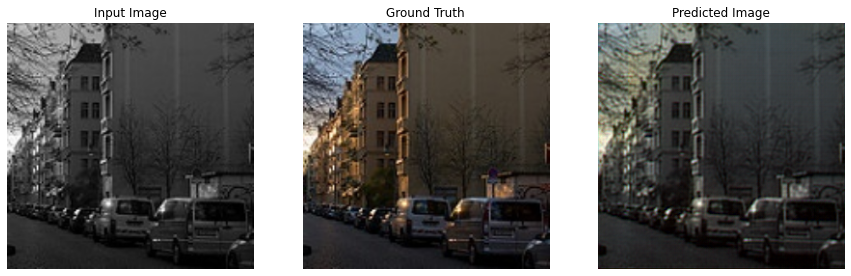

0.9988431897304483


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


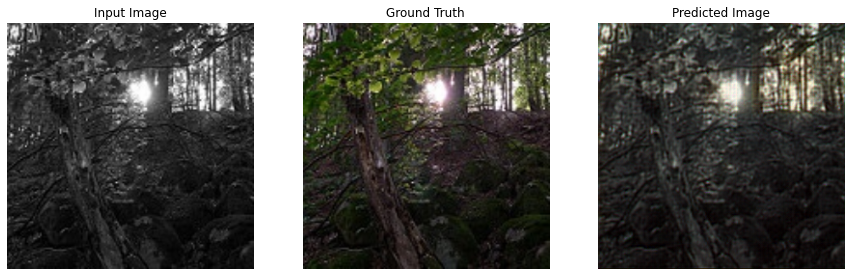

1.998014825374793


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


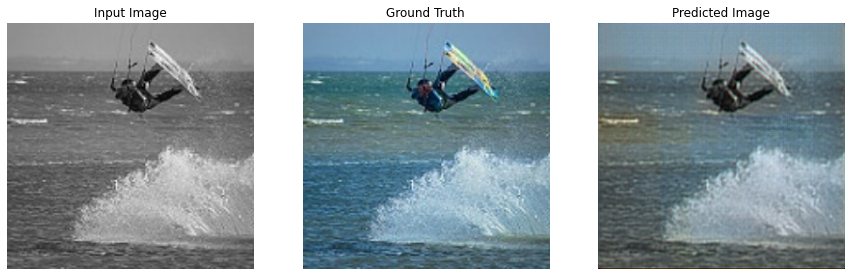

2.9962124327976425


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


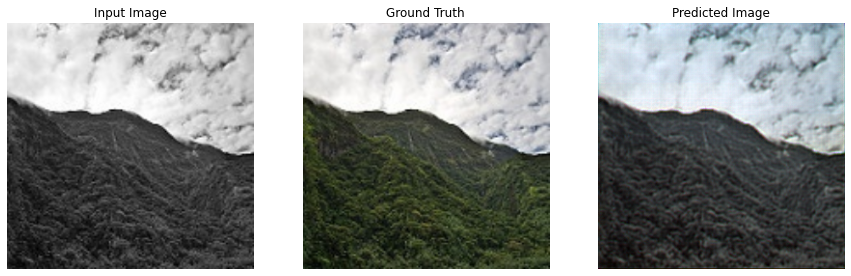

3.995101546349163


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


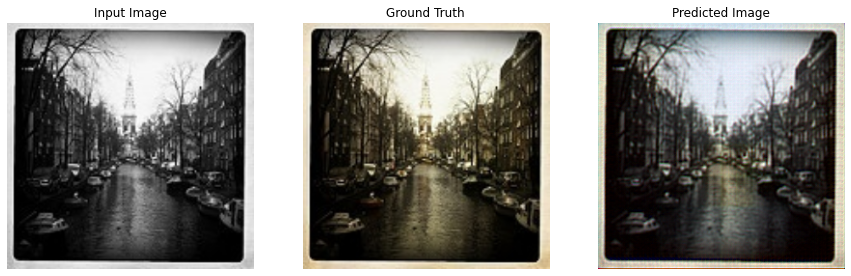

4.993909883119425


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


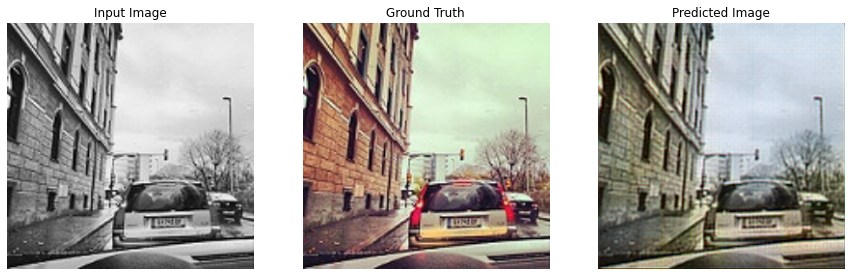

5.9917874715011505


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


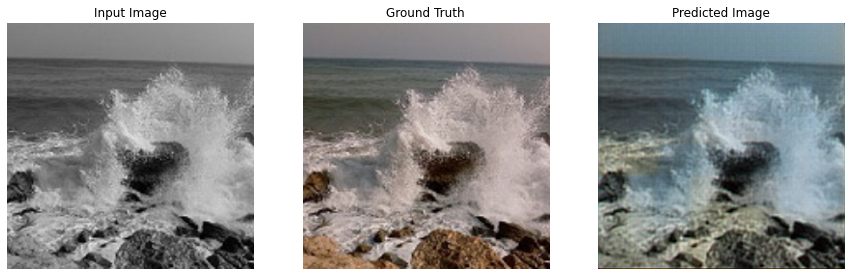

6.990570932024463


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


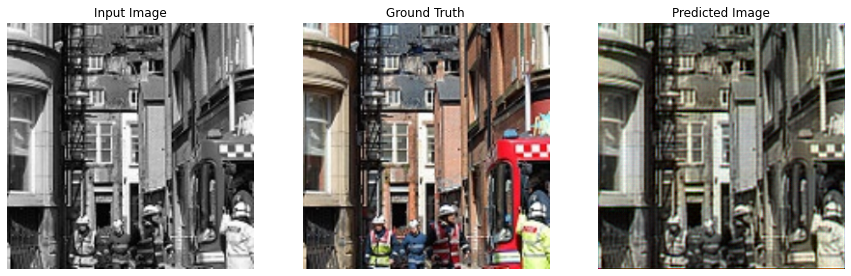

7.9891014097973585


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


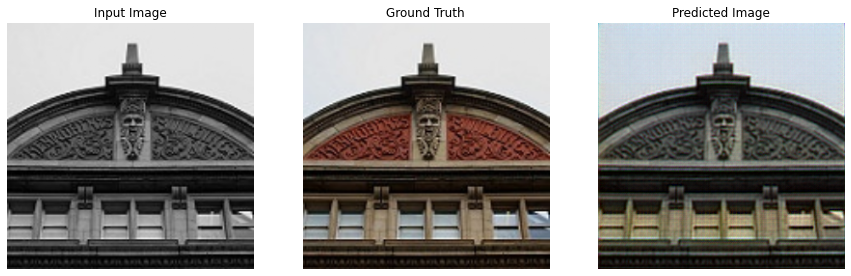

8.987661448077828


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


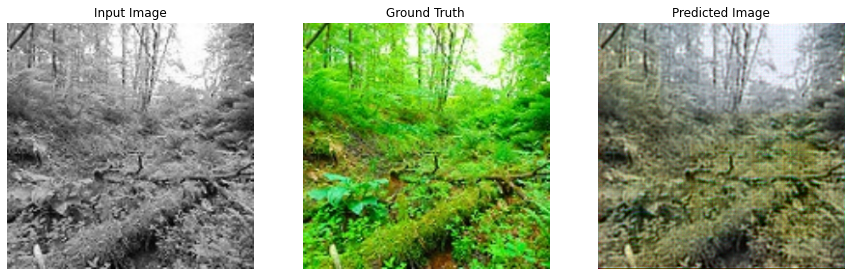

9.982023899249365


In [33]:
ssimValue1 = 0
for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)):
    generate_images(model, example_input, example_target)
    ssimValue1 += ssim(example_input,example_target)
    print(ssimValue1)

In [34]:
evaluate(model, tf.data.Dataset.zip((gray_dataset,color_dataset)))

1
2
3
4
5
6
7
8
9
10


(510.79449485521764, 21.048341529086485)

In [35]:
print(ssimValue1/10)

0.9982023899249365
